### Выполнил: Дашиев Батор

Точка отсчета: `0.8172`

генерация фичей (числовых): `+0.002`  after: `0.8192`

Генерация полиномиальных признаков на некоторых поднаборах числовых признаков: нет эффекта

Кластеризация с помощью HDBScan на данных размерности 2 (пониженной с помощью UMAP): `+0.0007`  after: `0.8199`

Добавление категориальных фич: `+0.0023`  after: `0.8222`

Признаки на основе ближайших соседей (HNSW): без особого эффекта

Подбор гиперпараметров optuna: без особого эффекта

In [1]:
import polars as pl
import pandas as pd
import numpy as np
import catboost
from catboost import CatBoostClassifier, CatBoostRegressor, Pool
import os
import optuna
from datetime import date, timedelta
from my_utils import embedding_plotter
from sklearn.preprocessing import StandardScaler
import umap.umap_ as umap
import shap
from sklearn.preprocessing import PolynomialFeatures
from sklearn.cluster import KMeans
import hdbscan
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import faiss

In [2]:
test_start_date = date(2024, 8, 1)
val_start_date = date(2024, 7, 1)
val_end_date = date(2024, 7, 31)
train_end_date = date(2024, 6, 30)
data_path = './contest_1_data'

# Read data

In [3]:
actions_history = pl.read_parquet(os.path.join(data_path, 'actions_history'))
search_history = pl.read_parquet(os.path.join(data_path, 'search_history'))
product_information = pl.read_csv(os.path.join(data_path, 'product_information.csv'))

Здесь добавил колонку в таблицу с информацией о продуктах - относительная скидка на продукт.

In [4]:
product_information = product_information.with_columns(
    ((pl.col("price") - pl.col("discount_price")) / pl.col("price")).alias(
        "relative_discount"
    )
)

In [5]:
actions_history.head(3)

user_id,timestamp,product_id,page_product_id,action_type_id,widget_name_id
i32,datetime[ns],i64,i64,i8,i8
7158706,2024-03-02 13:14:27,162625954,null,5,22
2762233,2024-05-28 14:20:44,148481523,null,5,22
6415797,2024-04-28 18:18:30,371796916,null,5,22


In [6]:
search_history.head(3)

user_id,timestamp,search_query,action_type_id,widget_name_id
i32,datetime[ns],str,i8,i8
1403825,2024-03-02 19:16:19,"""колонка алиса""",4,23
10278224,2024-07-29 12:10:06,"""батончик""",4,23
8162261,2024-04-24 06:27:10,"""hipp combiotic 1""",4,23


In [7]:
product_information.head(3)

product_id,name,brand,type,category_id,category_name,price,discount_price,relative_discount
i64,str,str,str,i64,str,f64,f64,f64
26176363,"""Развивающие тесты (3-4 года) (…","""Machaon""","""Печатная книга: Развитие детей""",780,"""Книги""",380.0,274.0,0.278947
29898500,"""Mexx Туалетная вода Ice Touch …","""Mexx""","""Туалетная вода""",117,"""Мужская""",2645.0,1859.0,0.297164
33967827,"""64 ГБ USB Флеш-накопитель USB …","""SmartBuy""","""USB-флеш-накопитель""",178,"""Флешки и CD-R""",1690.0,469.0,0.722485


In [8]:
pl.read_csv(os.path.join(data_path, 'action_type_info.csv'))

action_type,action_type_id
str,i64
"""click""",1
"""favorite""",2
"""order""",3
"""search""",4
"""to_cart""",5
"""view""",6


In [9]:
val_target = (
    actions_history
    .filter(pl.col('timestamp').dt.date() >= val_start_date)
    .filter(pl.col('timestamp').dt.date() <= val_end_date)
    .select('user_id', (pl.col('action_type_id') == 3).alias('has_order'))
    .group_by('user_id')
    .agg(pl.max('has_order').cast(pl.Int32).alias('target'))
)

In [10]:
val_target.group_by('target').agg(pl.count('user_id'))

target,user_id
i32,u32
0,1227381
1,647575


# Simple pipeline

## Feats

In [11]:
actions_aggs = {}
actions_id_to_suf = {
    1: "click",
    2: "favorite",
    3: "order",
    5: "to_cart",
}
for id_, suf in tqdm(actions_id_to_suf.items()):
    aggs = (
        actions_history
        .filter(pl.col('timestamp').dt.date() <= train_end_date)
        .filter(pl.col('timestamp').dt.date() >= train_end_date - timedelta(days=30 * 4))
        .filter(pl.col('action_type_id') == id_)
        .join(
            product_information
            .select('product_id', 'discount_price', 'relative_discount'),
            on='product_id',
        )
        .group_by('user_id')
        .agg(
            pl.count('product_id').cast(pl.Int32).alias(f'num_products_{suf}'),
            pl.sum('discount_price').cast(pl.Float32).alias(f'sum_discount_price_{suf}'),
            pl.max('discount_price').cast(pl.Float32).alias(f'max_discount_price_{suf}'),
            pl.mean('relative_discount').cast(pl.Float32).alias(f'mean_relative_discount_{suf}'), # new
            pl.max('relative_discount').cast(pl.Float32).alias(f'max_relative_discount_{suf}'), # new
            pl.max('timestamp').alias(f'last_{suf}_time'),
            pl.min('timestamp').alias(f'first_{suf}_time'),
        )
        .with_columns([
            (pl.lit(val_start_date) - pl.col(f'last_{suf}_time'))
            .dt.total_days()
            .cast(pl.Int32)
            .alias(f'days_since_last_{suf}'),
            
            (pl.lit(val_start_date) - pl.col(f'first_{suf}_time'))
            .dt.total_days()
            .cast(pl.Int32)
            .alias(f'days_since_first_{suf}'),
        ])
        .select(
            'user_id',
            f'num_products_{suf}',
            f'sum_discount_price_{suf}',
            f'max_discount_price_{suf}',
            f'mean_relative_discount_{suf}',
            f'max_relative_discount_{suf}',
            f'days_since_last_{suf}',
            f'days_since_first_{suf}',
        )
    )
    actions_aggs[id_] = aggs

  0%|          | 0/4 [00:00<?, ?it/s]

In [12]:
# search_aggs
id_ = 4
suf = 'search'
actions_aggs[id_] = (
    search_history
    .filter(pl.col('action_type_id') == id_)
    .filter(pl.col('timestamp').dt.date() <= train_end_date)
    .filter(pl.col('timestamp').dt.date() >= train_end_date - timedelta(days=30 * 4))
    .group_by('user_id')
    .agg(
        pl.count('search_query').cast(pl.Int32).alias(f'num_{suf}'),
        pl.max('timestamp').alias(f'last_{suf}_time'),
        pl.min('timestamp').alias(f'first_{suf}_time'),
    )
    .with_columns([
        (pl.lit(val_start_date) - pl.col(f'last_{suf}_time'))
        .dt.total_days()
        .cast(pl.Int32)
        .alias(f'days_since_last_{suf}'),

        (pl.lit(val_start_date) - pl.col(f'first_{suf}_time'))
        .dt.total_days()
        .cast(pl.Int32)
        .alias(f'days_since_first_{suf}'),
    ])
    .select(
        'user_id',
        f'num_{suf}',
        f'days_since_last_{suf}',
        f'days_since_first_{suf}',
    )
)

In [13]:
actions_aggs.keys()

dict_keys([1, 2, 3, 5, 4])

In [14]:
df = val_target
for _, actions_aggs_df in actions_aggs.items():
    df = (
        df
        .join(actions_aggs_df, on='user_id', how='left')
    )

In [15]:
df.shape

(1874956, 33)

In [16]:
df

user_id,target,num_products_click,sum_discount_price_click,max_discount_price_click,mean_relative_discount_click,max_relative_discount_click,days_since_last_click,days_since_first_click,num_products_favorite,sum_discount_price_favorite,max_discount_price_favorite,mean_relative_discount_favorite,max_relative_discount_favorite,days_since_last_favorite,days_since_first_favorite,num_products_order,sum_discount_price_order,max_discount_price_order,mean_relative_discount_order,max_relative_discount_order,days_since_last_order,days_since_first_order,num_products_to_cart,sum_discount_price_to_cart,max_discount_price_to_cart,mean_relative_discount_to_cart,max_relative_discount_to_cart,days_since_last_to_cart,days_since_first_to_cart,num_search,days_since_last_search,days_since_first_search
i32,i32,i32,f32,f32,f32,f32,i32,i32,i32,f32,f32,f32,f32,i32,i32,i32,f32,f32,f32,f32,i32,i32,i32,f32,f32,f32,f32,i32,i32,i32,i32,i32
327344,1,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2,404.0,344.0,0.154716,0.178998,7,38,1,7,7
5282028,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2868175,0,3,5977.0,2926.0,0.416963,0.480608,33,33,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,1,33,33
4223165,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
10862889,0,9,1563.0,303.0,0.071457,0.64311,49,112,null,null,null,null,null,null,null,null,null,null,null,null,null,null,1,63.0,63.0,0.0,0.0,58,58,13,3,120
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
1614630,0,1,109.0,109.0,0.358824,0.358824,67,67,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
10026155,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
1493100,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null


### Чистка от полностью пустых строк (optional)

В таблице, с которой будем далее работать, есть немало пропусков. Однако всякое заполнение отсутствующих значений (которое я пробовал) ухудшало качество. Это можно объяснить тем, что дерево хорошо справляется с пропусками, способно их обработать. Поэтому всякую интерполяцию/очистку данных не применяю.

In [17]:
# df_clear = df.filter(
#     ~pl.all_horizontal(pl.all().exclude(["user_id", "target"]).is_null())
# )
# df_empty = df.filter(
#     pl.all_horizontal(pl.all().exclude(["user_id", "target"]).is_null())
# )

In [18]:
# df = df_clear

### Текстовые признаки (optional)

Хотел сгенерировать следующие признаки: конкатенация всех поисковых запросов пользователя за некоторый период и конкатенация всех названий продуктов, купленных пользователем. Однако, как ни пытался, не смог разобраться с text_features, либо ловил ошибки, либо падало ядро. Поэтому далее участки в коде с text_features закомментированы.

In [19]:
text_search = (
    search_history
    .filter(pl.col('action_type_id') == 4)
    .filter(pl.col('timestamp').dt.date() <= train_end_date)
    .filter(pl.col('timestamp').dt.date() >= train_end_date - timedelta(days=30))
    .group_by('user_id')
    .agg(
        pl.col("search_query").str.concat(" ").alias("search_text")
    ).select(
        'user_id',
        'search_text',
    )
)
text_search

user_id,search_text
i32,str
319591,"""мои заказы на ozon"""
2624514,"""сухой корм для французского бу…"
8121493,"""мойка высокого давления для ав…"
4259753,"""щетка магги для стекол пилка д…"
6702548,"""что-то классное для девочек чт…"
…,…
9255392,"""сыр чечил напиток без газа сух…"
8710638,"""для бритья зарядка для макбука…"
1260425,"""бекон для жарки ветчина бекон …"


In [20]:
# df = df.join(text_search, on="user_id", how="left")

In [21]:
text_order = (
    actions_history
    .filter(pl.col('timestamp').dt.date() <= train_end_date)
    .filter(pl.col('timestamp').dt.date() >= train_end_date - timedelta(days=30 * 4))
    .filter(pl.col('action_type_id') == 3)
    .join(
        product_information
        .select('product_id', 'name', 'type'),
        on='product_id',
    )
    .group_by('user_id')
    .agg(
        pl.col("name").str.concat(" ").alias("name_text"),
        pl.col("type").str.concat(" ").alias("type_text")
    )
    .select(
        'user_id',
        'name_text',
        'type_text',
    )
)
text_order

user_id,name_text,type_text
i32,str,str
2897305,"""Желе с фруктами Клубника 150 г…","""Желе Булгур Пакет майка Йогурт…"
10749758,"""Пакет-майка OZON fresh Растите…","""Пакет майка Растительный напит…"
2386084,"""Пакет-майка OZON fresh Снежок …","""Пакет майка Кисломолочный прод…"
8188175,"""Салат «Салаты с Поля», руккола…","""Салат свежий Салат свежий Паке…"
2188032,"""Творожок, натуральный с хрустя…","""Творожный продукт Пакет майка …"
…,…,…
7363654,"""Шампиньоны резаные 400 г, Ozon…","""Грибы Тоник для ухода за кожей…"
9013404,"""Пакет-майка OZON fresh ACUVUE …","""Пакет майка Контактные линзы"""
6218950,"""Капсулы для стирки SYNERGETIC …","""Капсулы для стирки Кофе в капс…"


In [22]:
# df = df.join(text_order, on="user_id", how="left")

In [23]:
# text_features = ['name_text', 'type_text', 'search_text']

### Конверсии

Добавляю числовые признаки, имеющие смысл конверсий. Взял конверсии связанные со всеми активностями в логическом порядке (`conversion_list` ниже). Стоит также заметить, что это не чистые конверсии в том смысле, что из-за того, что данные могут отсутствовать, или вообще путь клиента будет неравномерным, так называемая конверсия может быть больше 1 (например, если клиент сделал заказы, не добавляя товар в избранное и т.д.).

In [24]:
conversion_list = [
    ('click', 'favorite'),
    ('click', 'to_cart'),
    ('click', 'order'),
    ('favorite', 'to_cart'),
    ('favorite', 'order'),
    ('to_cart', 'order')
]

In [25]:
df_conversions = {}
# конверсия из A в B
for A, B in conversion_list:
    df_conversions[f"{A}_to_{B}"] = (
        df.filter((pl.col(f"num_products_{A}") > 0) & (pl.col(f"num_products_{B}") > 0))
        .with_columns(
            (pl.col(f"num_products_{B}") / pl.col(f"num_products_{A}")).alias(
                f"{A}_to_{B}"
            ),
        ).select(["user_id", f"{A}_to_{B}"])
    )

In [26]:
df_conversions

{'click_to_favorite': shape: (289_869, 2)
 ┌─────────┬───────────────────┐
 │ user_id ┆ click_to_favorite │
 │ ---     ┆ ---               │
 │ i32     ┆ f64               │
 ╞═════════╪═══════════════════╡
 │ 4031776 ┆ 0.2               │
 │ 7361600 ┆ 0.333333          │
 │ 7602933 ┆ 0.39819           │
 │ 9348525 ┆ 0.047619          │
 │ 8030361 ┆ 0.022727          │
 │ …       ┆ …                 │
 │ 4922008 ┆ 0.142857          │
 │ 8420954 ┆ 0.261905          │
 │ 2048358 ┆ 0.052632          │
 │ 8910643 ┆ 0.0703125         │
 │ 9344377 ┆ 0.11194           │
 └─────────┴───────────────────┘,
 'click_to_to_cart': shape: (867_406, 2)
 ┌──────────┬──────────────────┐
 │ user_id  ┆ click_to_to_cart │
 │ ---      ┆ ---              │
 │ i32      ┆ f64              │
 ╞══════════╪══════════════════╡
 │ 10862889 ┆ 0.111111         │
 │ 4031776  ┆ 0.8              │
 │ 4151341  ┆ 0.428571         │
 │ 5493049  ┆ 0.73913          │
 │ 7361600  ┆ 0.333333         │
 │ …        ┆ …          

In [27]:
for A, B in conversion_list:
    df = df.join(df_conversions[f"{A}_to_{B}"], on="user_id", how="left")

### Окно по 7, 14, 30 дней

Добавляю аналоги агрегационных признаков, сгенерированных семинаристом, при том изменении, что они берутся за последние 7/14/30 дней. Эти значения могут отображать, насколько активен клиент на относительно коротком промежутке времени.

In [28]:
action_aggs_window = {}
actions_id_to_suf = {
        1: "click",
        2: "favorite",
        3: "order",
        5: "to_cart",
    }
for window in [7, 14, 30]:
    action_aggs_window[window] = {}
    for id_, suf in tqdm(actions_id_to_suf.items()):
        action_aggs_window[window][id_] = (
            actions_history
            .filter(pl.col('timestamp').dt.date() <= train_end_date)
            .filter(pl.col('timestamp').dt.date() >= train_end_date - timedelta(days=window))
            .filter(pl.col('action_type_id') == id_)
            .join(
                product_information
                .select('product_id', 'discount_price', 'relative_discount'),
                on='product_id',
            )
            .group_by('user_id')
            .agg(
                pl.count('product_id').cast(pl.Int32).alias(f'num_products_{suf}_{window}'),
                pl.sum('discount_price').cast(pl.Float32).alias(f'sum_discount_price_{suf}_{window}'),
                pl.max('discount_price').cast(pl.Float32).alias(f'max_discount_price_{suf}_{window}'),
                pl.mean('relative_discount').cast(pl.Float32).alias(f'mean_relative_discount_{suf}_{window}'),
                pl.max('relative_discount').cast(pl.Float32).alias(f'max_relative_discount_{suf}_{window}')
            )
            .select(
                'user_id',
                f'num_products_{suf}_{window}',
                f'sum_discount_price_{suf}_{window}',
                f'max_discount_price_{suf}_{window}',
                f'mean_relative_discount_{suf}_{window}',
                f'max_relative_discount_{suf}_{window}',
            )
        )

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

In [29]:
id_ = 4
suf = 'search'
for window in [7, 14, 30]:
    action_aggs_window[window][id_] = (
        search_history
        .filter(pl.col('action_type_id') == id_)
        .filter(pl.col('timestamp').dt.date() <= train_end_date)
        .filter(pl.col('timestamp').dt.date() >= train_end_date - timedelta(days=window))
        .group_by('user_id')
        .agg(
            pl.count('search_query').cast(pl.Int32).alias(f'num_{suf}_{window}'),
        )
        .select(
            'user_id',
            f'num_{suf}_{window}',
        )
    )

In [30]:
action_aggs_window

{7: {1: shape: (538_744, 6)
  ┌─────────┬─────────────────────┬─────────────────────┬─────────────────────┬─────────────────────┬────────────────────┐
  │ user_id ┆ num_products_click_ ┆ sum_discount_price_ ┆ max_discount_price_ ┆ mean_relative_disco ┆ max_relative_disco │
  │ ---     ┆ 7                   ┆ click_7             ┆ click_7             ┆ unt_click_7         ┆ unt_click_7        │
  │ i32     ┆ ---                 ┆ ---                 ┆ ---                 ┆ ---                 ┆ ---                │
  │         ┆ i32                 ┆ f32                 ┆ f32                 ┆ f32                 ┆ f32                │
  ╞═════════╪═════════════════════╪═════════════════════╪═════════════════════╪═════════════════════╪════════════════════╡
  │ 8038608 ┆ 20                  ┆ 5305.0              ┆ 759.0               ┆ 0.040498            ┆ 0.531293           │
  │ 2852705 ┆ 17                  ┆ 5161.0              ┆ 729.0               ┆ 0.177865            ┆ 0.518769 

In [31]:
for window in [7, 14, 30]:
    for action_id in range(1, 6):
        df = df.join(action_aggs_window[window][action_id], on="user_id", how="left")

### Средняя длина поискового запроса

In [32]:
df = df.join(
    search_history
    .filter(pl.col('timestamp').dt.date() <= train_end_date)
    .filter(pl.col('timestamp').dt.date() >= train_end_date - timedelta(days=window))
    .group_by("user_id").agg(
        pl.col("search_query").len().alias("mean_length_of_query")
    ).cast(pl.Int32),
    on="user_id", how="left"
)

### Число активностей по виджетам

В данном признаке считаю, сколько раз клиент взаимодействовал с каждым виджетом.

In [33]:
widget_pivot = (
    actions_history
    .filter(pl.col('timestamp').dt.date() <= train_end_date)
    .filter(pl.col('timestamp').dt.date() >= train_end_date - timedelta(days=30 * 4))
    .pivot(
        index="user_id",          # группируем по user_id
        on="widget_name_id",      # создаём столбцы для каждого widget_id
        values="widget_name_id",       # будем агрегировать по widget_id
        aggregate_function="len"      # считаем количество записей
    ).
    fill_null(0)
)
widget_pivot = widget_pivot.select(
    ["user_id"] + sorted(widget_pivot.columns[1:], key=lambda x: int(x))
)

In [34]:
for col in widget_pivot.columns:
    widget_pivot = widget_pivot.with_columns(
    pl.col(col).cast(pl.Int32)
)
widget_pivot = widget_pivot.drop("13")
widget_pivot

user_id,1,3,4,5,6,7,8,9,10,11,12,14,15,16,17,18,19,20,21,22,25
i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32
7158706,5,79,28,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,10,434,0
2762233,1,22,8,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,4,150,0
6415797,2,268,36,0,0,42,4,0,0,0,4,0,0,0,0,0,0,0,26,310,1
11178472,6,24,4,0,0,6,0,0,0,0,1,0,0,0,0,0,0,0,1,45,0
2695403,5,20,7,0,0,5,0,0,0,0,0,0,1,0,0,0,0,0,6,130,0
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
2472401,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
754777,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4237187,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [35]:
df = df.join(widget_pivot, on="user_id", how="left")

### Заполнение нанов нулями (optional)

Как я уже обсуждал выше, заполнение NaN-ов не увенчалось успехом.

In [36]:
# df = df.with_columns(
#     pl.col(col).fill_null(0) 
#     for col in df.columns 
#     if not col.startswith("days")
# )

### Полиномиальные фичи (optional)

Пробовал прикрутить полиномиальные фичи (перекрестные, степени 2) для некоторой выборки наборов признаков. Однако, это не дало значимого результата. Видимо модель сама вполне отслеживает такого рода зависимости.

In [37]:
# columns_poly_list = [
#     ["num_products_order",	"sum_discount_price_order",	"max_discount_price_order"],
#     ["num_products_to_cart", "sum_discount_price_to_cart", "max_discount_price_to_cart"],
#     # ["num_products_favorite",	"sum_discount_price_favorite",	"max_discount_price_favorite"],
#     # ["num_products_click", "num_products_favorite", "num_products_order", "num_products_to_cart"],
#     ["click_to_to_cart", "click_to_order", "to_cart_to_order"],
#     ['num_search', 'mean_length_of_query']
# ]

In [38]:
# for cols in columns_poly_list:
#     df_poly = df.select(["user_id"] + cols)
#     for col in cols:
#         df_poly = df_poly.filter(pl.col(col).is_not_null())

#     X = df_poly.select(cols)
#     poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
#     X_poly = poly.fit_transform(X)
    
#     all_cols = list(poly.get_feature_names_out(cols))
#     new_cols = [col for col in all_cols if col not in cols]
#     df_poly = df_poly.select("user_id").hstack(pl.DataFrame(X_poly, schema=all_cols).select(new_cols))
    
#     df = df.join(df_poly, on="user_id", how="left")

In [39]:
df.write_csv("df_numerical.csv")

In [40]:
df

user_id,target,num_products_click,sum_discount_price_click,max_discount_price_click,mean_relative_discount_click,max_relative_discount_click,days_since_last_click,days_since_first_click,num_products_favorite,sum_discount_price_favorite,max_discount_price_favorite,mean_relative_discount_favorite,max_relative_discount_favorite,days_since_last_favorite,days_since_first_favorite,num_products_order,sum_discount_price_order,max_discount_price_order,mean_relative_discount_order,max_relative_discount_order,days_since_last_order,days_since_first_order,num_products_to_cart,sum_discount_price_to_cart,max_discount_price_to_cart,mean_relative_discount_to_cart,max_relative_discount_to_cart,days_since_last_to_cart,days_since_first_to_cart,num_search,days_since_last_search,days_since_first_search,click_to_favorite,click_to_to_cart,click_to_order,favorite_to_to_cart,…,sum_discount_price_favorite_30,max_discount_price_favorite_30,mean_relative_discount_favorite_30,max_relative_discount_favorite_30,num_products_order_30,sum_discount_price_order_30,max_discount_price_order_30,mean_relative_discount_order_30,max_relative_discount_order_30,num_search_30,num_products_to_cart_30,sum_discount_price_to_cart_30,max_discount_price_to_cart_30,mean_relative_discount_to_cart_30,max_relative_discount_to_cart_30,mean_length_of_query,1,3,4,5,6,7,8,9,10,11,12,14,15,16,17,18,19,20,21,22,25
i32,i32,i32,f32,f32,f32,f32,i32,i32,i32,f32,f32,f32,f32,i32,i32,i32,f32,f32,f32,f32,i32,i32,i32,f32,f32,f32,f32,i32,i32,i32,i32,i32,f64,f64,f64,f64,…,f32,f32,f32,f32,i32,f32,f32,f32,f32,i32,i32,f32,f32,f32,f32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32,i32
327344,1,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2,404.0,344.0,0.154716,0.178998,7,38,1,7,7,null,null,null,null,…,null,null,null,null,null,null,null,null,null,1,1,344.0,344.0,0.178998,0.178998,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
5282028,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,…,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2868175,0,3,5977.0,2926.0,0.416963,0.480608,33,33,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,1,33,33,null,null,null,null,…,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0
4223165,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,…,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
10862889,0,9,1563.0,303.0,0.071457,0.64311,49,112,null,null,null,null,null,null,null,null,null,null,null,null,null,null,1,63.0,63.0,0.0,0.0,58,58,13,3,120,null,0.111111,null,null,…,null,null,null,null,null,null,null,null,null,1,null,null,null,null,null,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8,1
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
1614630,0,1,109.0,109.0,0.358824,0.358824,67,67,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,…,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
10026155,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,…,null,null,null,null,null,

### Some categorical features

В данном разделе добавляю категориальные признаки.

В следующей ячейке генерируем бинарные признаки, отвечающие за то, была ли покупка у клиента за последний месяц, два и три (3 признака).

In [41]:
df_is_ordered = (
    actions_history
    .filter(pl.col('timestamp').dt.date() <= train_end_date)
    .filter(pl.col('timestamp').dt.date() >= train_end_date - timedelta(days=30 * 4))
    .filter(pl.col('action_type_id') == 3).group_by("user_id")
    .agg(
        pl.col("timestamp").max().alias("last_order_ts"),
        purchased_last_month=pl.col("timestamp")
            .filter(pl.col("timestamp") >= train_end_date - timedelta(days=30))
            .count() > 0,
        purchased_last_2months=pl.col("timestamp")
            .filter(pl.col("timestamp") >= train_end_date - timedelta(days=30 * 2))
            .count() > 0,
        purchased_last_3months=pl.col("timestamp")
            .filter(pl.col("timestamp") >= train_end_date - timedelta(days=30 * 3))
            .count() > 0
    )
).drop("last_order_ts")

In [42]:
df_is_to_cart = (
    actions_history
    .filter(pl.col('timestamp').dt.date() <= train_end_date)
    .filter(pl.col('timestamp').dt.date() >= train_end_date - timedelta(days=30 * 4))
    .filter(pl.col('action_type_id') == 5).group_by("user_id")
    .agg(
        pl.col("timestamp").max().alias("last_to_cart_ts"),
        to_cart_last_month=pl.col("timestamp")
            .filter(pl.col("timestamp") >= train_end_date - timedelta(days=30))
            .count() > 0,
        to_cart_last_2months=pl.col("timestamp")
            .filter(pl.col("timestamp") >= train_end_date - timedelta(days=30 * 2))
            .count() > 0,
        to_cart_last_3months=pl.col("timestamp")
            .filter(pl.col("timestamp") >= train_end_date - timedelta(days=30 * 3))
            .count() > 0
    )
).drop("last_to_cart_ts")

Добавим по каждому пользователю топ `k` самых частых категорий товаров в каждом типе активности (без `search`, так как поисковые запросы не привязаны к товару).
Я решил брать по `k = 3` категории.

In [43]:
k = 3
topk_product_cats = {}
actions_id_to_suf = {
    1: "click",
    2: "favorite",
    3: "order",
    5: "to_cart",
}
for id_, suf in tqdm(actions_id_to_suf.items()):
    topk_agg = (
        actions_history
        .filter(pl.col('timestamp').dt.date() <= train_end_date)
        .filter(pl.col('timestamp').dt.date() >= train_end_date - timedelta(days=30 * 4))
        .filter(pl.col("action_type_id") == id_)
        .join(
            product_information.select(["product_id", "category_name"]),
            on="product_id",
        )
        .group_by("user_id", "category_name")
        .agg(pl.len().alias("count"))
        .with_columns(
            pl.col("category_name").sort_by(by=["count", "category_name"], descending=[True, False])
            .over("user_id")
            .alias("sorted_values")
        )
        .group_by("user_id")
        .agg(pl.col("sorted_values").head(k).alias("top_values"))
        .with_columns(
            pl.col("top_values").list.to_struct(fields=[f"top{i}_cat_in_{suf}" for i in range(1, k + 1)])
        )
        .unnest(columns="top_values")
    )
    topk_product_cats[id_] = topk_agg

  0%|          | 0/4 [00:00<?, ?it/s]

Также добавим аналогичные признаки, но уже связанные с самыми часто используемыми виджетами по каждому виду активности (кроме `order`, так как на активность типа заказа уделен только один виджет).

In [44]:
k = 3
topk_widg = {}
actions_id_to_suf = {
    1: "click",
    2: "favorite",
    # 3: "order", так как в заказе только один виджет, нет смысла
    5: "to_cart",
}
for id_, suf in tqdm(actions_id_to_suf.items()):
    topk_agg = (
        actions_history
        .filter(pl.col('timestamp').dt.date() <= train_end_date)
        .filter(pl.col('timestamp').dt.date() >= train_end_date - timedelta(days=30 * 4))
        .filter(pl.col("action_type_id") == id_)
        .group_by("user_id", "widget_name_id")
        .agg(pl.len().alias("count"))
        .with_columns(
            pl.col("widget_name_id").sort_by(by=["count", "widget_name_id"], descending=[True, False])
            .over("user_id")
            .alias("sorted_values")
        )
        .group_by("user_id")
        .agg(pl.col("sorted_values").head(k).alias("top_values"))
        .with_columns(
            pl.col("top_values").list.to_struct(fields=[f"top{i}_widget_in_{suf}" for i in range(1, k + 1)])
        )
        .unnest(columns="top_values")
    )
    topk_widg[id_] = topk_agg

  0%|          | 0/3 [00:00<?, ?it/s]

In [45]:
# for search
k = 3

topk_agg = (
    search_history
    .filter(pl.col('timestamp').dt.date() <= train_end_date)
    .filter(pl.col('timestamp').dt.date() >= train_end_date - timedelta(days=30 * 4))
    .filter(pl.col("action_type_id") == 4)
    .group_by("user_id", "widget_name_id")
    .agg(pl.len().alias("count"))
    .with_columns(
        pl.col("widget_name_id").sort_by(by=["count", "widget_name_id"], descending=[True, False])
        .over("user_id")
        .alias("sorted_values")
    )
    .group_by("user_id")
    .agg(pl.col("sorted_values").head(k).alias("top_values"))
    .with_columns(
        pl.col("top_values").list.to_struct(fields=[f"top{i}_widget_in_search" for i in range(1, k + 1)])
    ).unnest(columns="top_values")
)
topk_widg[4] = topk_agg

In [46]:
topk_product_cats

{1: shape: (3_821_124, 4)
 ┌──────────┬─────────────────────────┬───────────────────────────────┬───────────────────┐
 │ user_id  ┆ top1_cat_in_click       ┆ top2_cat_in_click             ┆ top3_cat_in_click │
 │ ---      ┆ ---                     ┆ ---                           ┆ ---               │
 │ i32      ┆ str                     ┆ str                           ┆ str               │
 ╞══════════╪═════════════════════════╪═══════════════════════════════╪═══════════════════╡
 │ 8118831  ┆ Специальные препараты   ┆ null                          ┆ null              │
 │ 10012704 ┆ Куклы                   ┆ null                          ┆ null              │
 │ 10873378 ┆ Для кухни               ┆ Специальные чистящие средства ┆ null              │
 │ 10348521 ┆ Большая упаковка        ┆ null                          ┆ null              │
 │ 457225   ┆ Говядина                ┆ Бездрожжевой хлеб             ┆ Белый хлеб        │
 │ …        ┆ …                       ┆ …             

In [47]:
topk_widg

{1: shape: (3_834_110, 4)
 ┌─────────┬──────────────────────┬──────────────────────┬──────────────────────┐
 │ user_id ┆ top1_widget_in_click ┆ top2_widget_in_click ┆ top3_widget_in_click │
 │ ---     ┆ ---                  ┆ ---                  ┆ ---                  │
 │ i32     ┆ i8                   ┆ i8                   ┆ i8                   │
 ╞═════════╪══════════════════════╪══════════════════════╪══════════════════════╡
 │ 7548264 ┆ 22                   ┆ null                 ┆ null                 │
 │ 4756781 ┆ 22                   ┆ 7                    ┆ 1                    │
 │ 2718632 ┆ 25                   ┆ null                 ┆ null                 │
 │ 3094452 ┆ 22                   ┆ 7                    ┆ null                 │
 │ 1725841 ┆ 22                   ┆ null                 ┆ null                 │
 │ …       ┆ …                    ┆ …                    ┆ …                    │
 │ 2254919 ┆ 25                   ┆ null                 ┆ null         

In [48]:
df = df.join(df_is_ordered, on="user_id", how="left")
df = df.join(df_is_to_cart, on="user_id", how="left")
for id_ in [1, 2, 3, 5]:
    df = df.join(topk_product_cats[id_], on="user_id", how="left")
for id_ in [1, 2, 4, 5]:
    df = df.join(topk_widg[id_], on="user_id", how="left")

Для корректной обработки категориальных признаков моделью CatBoost заполним в соответствующих колонках пропуски.

In [49]:
df = df.with_columns(pl.col("purchased_last_month").fill_null(False))
df = df.with_columns(pl.col("purchased_last_2months").fill_null(False))
df = df.with_columns(pl.col("purchased_last_3months").fill_null(False))

df = df.with_columns(pl.col("to_cart_last_month").fill_null(False))
df = df.with_columns(pl.col("to_cart_last_2months").fill_null(False))
df = df.with_columns(pl.col("to_cart_last_3months").fill_null(False))

In [50]:
for col in [col for col in df.columns if col.find("cat") != -1]:
    df = df.with_columns(pl.col(col).fill_null(""))

for col in [col for col in df.columns if col.find("widget") != -1]:
    df = df.with_columns(pl.col(col).fill_null(0))

In [51]:
df

user_id,target,num_products_click,sum_discount_price_click,max_discount_price_click,mean_relative_discount_click,max_relative_discount_click,days_since_last_click,days_since_first_click,num_products_favorite,sum_discount_price_favorite,max_discount_price_favorite,mean_relative_discount_favorite,max_relative_discount_favorite,days_since_last_favorite,days_since_first_favorite,num_products_order,sum_discount_price_order,max_discount_price_order,mean_relative_discount_order,max_relative_discount_order,days_since_last_order,days_since_first_order,num_products_to_cart,sum_discount_price_to_cart,max_discount_price_to_cart,mean_relative_discount_to_cart,max_relative_discount_to_cart,days_since_last_to_cart,days_since_first_to_cart,num_search,days_since_last_search,days_since_first_search,click_to_favorite,click_to_to_cart,click_to_order,favorite_to_to_cart,…,17,18,19,20,21,22,25,purchased_last_month,purchased_last_2months,purchased_last_3months,to_cart_last_month,to_cart_last_2months,to_cart_last_3months,top1_cat_in_click,top2_cat_in_click,top3_cat_in_click,top1_cat_in_favorite,top2_cat_in_favorite,top3_cat_in_favorite,top1_cat_in_order,top2_cat_in_order,top3_cat_in_order,top1_cat_in_to_cart,top2_cat_in_to_cart,top3_cat_in_to_cart,top1_widget_in_click,top2_widget_in_click,top3_widget_in_click,top1_widget_in_favorite,top2_widget_in_favorite,top3_widget_in_favorite,top1_widget_in_search,top2_widget_in_search,top3_widget_in_search,top1_widget_in_to_cart,top2_widget_in_to_cart,top3_widget_in_to_cart
i32,i32,i32,f32,f32,f32,f32,i32,i32,i32,f32,f32,f32,f32,i32,i32,i32,f32,f32,f32,f32,i32,i32,i32,f32,f32,f32,f32,i32,i32,i32,i32,i32,f64,f64,f64,f64,…,i32,i32,i32,i32,i32,i32,i32,bool,bool,bool,bool,bool,bool,str,str,str,str,str,str,str,str,str,str,str,str,i8,i8,i8,i8,i8,i8,i8,i8,i8,i8,i8,i8
327344,1,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2,404.0,344.0,0.154716,0.178998,7,38,1,7,7,null,null,null,null,…,0,0,0,0,0,1,0,false,false,false,true,true,true,"""""","""""","""""","""""","""""","""""","""""","""""","""""","""Мясное""","""Печенье""","""""",0,0,0,0,0,0,24,0,0,4,22,0
5282028,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,…,null,null,null,null,null,null,null,false,false,false,false,false,false,"""""","""""","""""","""""","""""","""""","""""","""""","""""","""""","""""","""""",0,0,0,0,0,0,0,0,0,0,0,0
2868175,0,3,5977.0,2926.0,0.416963,0.480608,33,33,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,1,33,33,null,null,null,null,…,0,0,0,0,0,1,0,false,false,false,false,false,false,"""Уход за больными""","""""","""""","""""","""""","""""","""""","""""","""""","""""","""""","""""",12,22,0,0,0,0,23,0,0,0,0,0
4223165,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,…,null,null,null,null,null,null,null,false,false,false,false,false,false,"""""","""""","""""","""""","""""","""""","""""","""""","""""","""""","""""","""""",0,0,0,0,0,0,0,0,0,0,0,0
10862889,0,9,1563.0,303.0,0.071457,0.64311,49,112,null,null,null,null,null,null,null,null,null,null,null,null,null,null,1,63.0,63.0,0.0,0.0,58,58,13,3,120,null,0.111111,null,null,…,0,0,0,0,0,8,1,false,false,false,false,true,true,"""Овощные""","""Отбеливатели""","""Паштеты""","""""","""""","""""","""""","""""","""""","""Порционное""","""""","""""",22,25,0,0,0,0,24,2,0,4,0,0
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
1614630,0,1,109.0,109.0,0.358824,0.358824,67,67,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,…,0,0,0,0,0,1,0,false,false,false,fal

In [52]:
df.write_csv("df_pretrain.csv")

### Понижение размерности, кластеризация

In [53]:
# сброс ноутбука, освобождение памяти
%reset -f
import gc
gc.collect()

In [1]:
import polars as pl
import pandas as pd
import numpy as np
import catboost
from catboost import CatBoostClassifier, CatBoostRegressor, Pool
import os
import optuna
from datetime import date, timedelta
from my_utils import embedding_plotter
from sklearn.preprocessing import StandardScaler
import umap.umap_ as umap
import shap
from sklearn.preprocessing import PolynomialFeatures
from sklearn.cluster import KMeans
import hdbscan
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import faiss

In [1]:
from IPython.display import Image

In [2]:
df_pd = pd.read_csv("df_pretrain.csv")
for col in [col for col in df_pd.columns if col.find("cat") != -1]:
    df_pd[col] = df_pd[col].fillna("")

for col in [col for col in df_pd.columns if col.find("widget") != -1]:
    df_pd[col] = df_pd[col].fillna(0)

В данном разделе проведем генерацию признака с помощью кластеризации. Кластеризировать будем данные, полученные из интерпретации модели с помощью модуля `shap`. Значения будем получать из так называемой базовой модели.

##### Обучение базовой модели

In [3]:
actions_id_to_suf = {
    1: "click",
    2: "favorite",
    3: "order",
    4: "search",
    5: "to_cart",
}
k = 3
categorical_features = (
    [
        "purchased_last_month",
        "purchased_last_2months",
        "purchased_last_3months",
        "to_cart_last_month",
        "to_cart_last_2months",
        "to_cart_last_3months",
    ]
    + [
        f"top{i}_cat_in_{actions_id_to_suf[id_]}"
        for i in range(1, k + 1)
        for id_ in [1, 2, 3, 5]
    ]
    + [
        f"top{i}_widget_in_{actions_id_to_suf[id_]}"
        for i in range(1, k + 1)
        for id_ in [1, 2, 4, 5]
    ]
)

In [4]:
mask = df_pd.user_id % 10 <= 6
cols = [col for col in df_pd.columns if col not in ["user_id", "target"]]

train_pool = catboost.Pool(
    df_pd.loc[mask, cols],
    label=df_pd.loc[mask].target,
    cat_features=categorical_features,
    # text_features=text_features
)
eval_pool = catboost.Pool(
    df_pd.loc[~mask, cols],
    label=df_pd.loc[~mask].target,
    cat_features=categorical_features,
    # text_features=text_features
)

In [5]:
params = {
    'iterations': 200,
    'depth': 7, 
    'learning_rate': 0.1, 
    'random_state': 1,
    'eval_metric': 'AUC',
    'loss_function': 'Logloss',
    'task_type': 'CPU',
}

model_basic = catboost.CatBoost(params)
model_basic.fit(
    train_pool, 
    eval_set=eval_pool,
    use_best_model=True,
    verbose=10,
    early_stopping_rounds=50,
)
model_basic.save_model("model_basic")

0:	test: 0.7423198	best: 0.7423198 (0)	total: 3.45s	remaining: 11m 27s
10:	test: 0.7554135	best: 0.7554135 (10)	total: 35.7s	remaining: 10m 12s
20:	test: 0.7589773	best: 0.7589773 (20)	total: 1m 6s	remaining: 9m 29s
30:	test: 0.7608438	best: 0.7608438 (30)	total: 1m 40s	remaining: 9m 9s
40:	test: 0.7618333	best: 0.7618333 (40)	total: 2m 13s	remaining: 8m 39s
50:	test: 0.7623810	best: 0.7623810 (50)	total: 2m 46s	remaining: 8m 7s
60:	test: 0.7627377	best: 0.7627377 (60)	total: 3m 20s	remaining: 7m 36s
70:	test: 0.7630098	best: 0.7630098 (70)	total: 3m 52s	remaining: 7m 3s
80:	test: 0.7631997	best: 0.7631997 (80)	total: 4m 26s	remaining: 6m 31s
90:	test: 0.7634404	best: 0.7634513 (87)	total: 4m 59s	remaining: 5m 58s
100:	test: 0.7636396	best: 0.7636396 (100)	total: 5m 31s	remaining: 5m 24s
110:	test: 0.7637841	best: 0.7637841 (110)	total: 6m 3s	remaining: 4m 51s
120:	test: 0.7639694	best: 0.7639694 (120)	total: 6m 36s	remaining: 4m 18s
130:	test: 0.7641050	best: 0.7641050 (130)	total: 7m

#### Интерпретация. Выделение массива `shap_values` вклада фичей по объектам

In [6]:
explainer = shap.TreeExplainer(model_basic)

In [7]:
shap_values = explainer(df_pd.loc[~mask, cols])

In [8]:
shap_values.values.shape

(563320, 152)

##### Понижение размерности UMAP

Чтобы сократить время работы метода понижения размерности `UMAP`, возьмем подвыборку сокращенного размера `N_shap`.

P.S. В данной части к сожалению ячейки выполнены не в непрерывном порядке. Это связано с тем, что почему-то в UMAP random_state не фиксировал картину эмбеддинга - в каждый раз были разные значения. В связи с этим прямо на месте настраивал параметры `umap.UMAP()` и кластеризации `HDBSCAN`.

In [9]:
N_shap = 250000

shap_values_small = shap_values.values[:N_shap, :]
shap_values_small.shape

(250000, 152)

Отрисовка 2D-эмбеддинга, построенного с помощью `UMAP`.

In [10]:
embedding_umap = umap.UMAP(
    n_components=2,
    n_neighbors=30,
    min_dist=0.3,
    spread=1.25,
    verbose=True,
    low_memory=True,
    n_jobs=-1,
    random_state=52
).fit_transform(shap_values_small)

UMAP(min_dist=0.3, n_jobs=1, n_neighbors=30, random_state=52, spread=1.25, verbose=True)
Wed Apr  9 17:40:50 2025 Construct fuzzy simplicial set
Wed Apr  9 17:40:50 2025 Finding Nearest Neighbors
Wed Apr  9 17:40:50 2025 Building RP forest with 30 trees
Wed Apr  9 17:41:07 2025 NN descent for 18 iterations
	 1  /  18
	 2  /  18
	 3  /  18
	Stopping threshold met -- exiting after 3 iterations
Wed Apr  9 17:41:48 2025 Finished Nearest Neighbor Search
Wed Apr  9 17:41:53 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Wed Apr  9 17:57:28 2025 Finished embedding


In [11]:
embedding_plotter(embedding_umap, shap_values_small)

Loading BokehJS ...

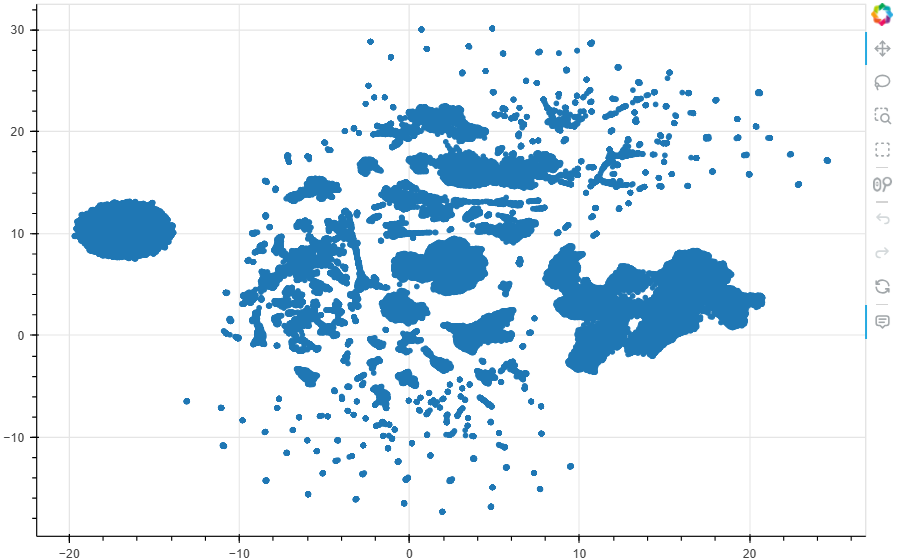

In [2]:
Image('1.png')

После небольшого подбора параметров в `umap.UMAP()` получаем картину, на которой уже визуально выделяется некоторое количество кластеров.

Проведем кластеризацию с помощью `KMeans` и `HDBSCAN`.

##### Кластеризация KMeans

In [14]:
kmeans = KMeans(n_clusters=12, random_state=42)
clusters_kmeans = kmeans.fit_predict(embedding_umap)

In [15]:
shap_pd = pd.DataFrame(shap_values_small)
shap_pd["cluster"] = clusters_kmeans
embedding_plotter(embedding_umap, shap_pd, hue='cluster')

Loading BokehJS ...

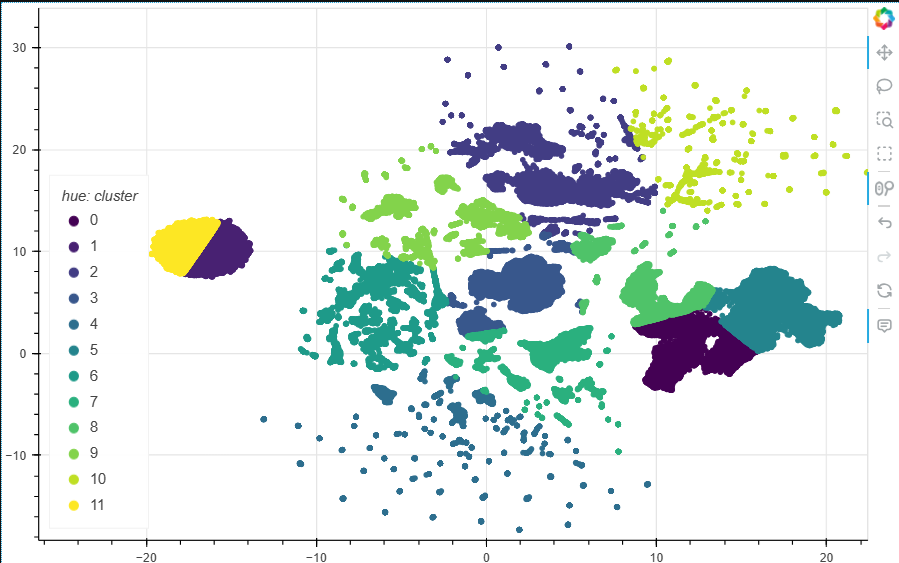

In [3]:
Image('2.png')

##### Кластеризация HDBSCAN

In [34]:
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=5000,
    min_samples=30,
)
clusters_hdbscan = clusterer.fit_predict(embedding_umap)

In [35]:
shap_pd = pd.DataFrame(shap_values_small)
shap_pd["cluster"] = clusters_hdbscan
embedding_plotter(embedding_umap, shap_pd, hue='cluster')

Loading BokehJS ...

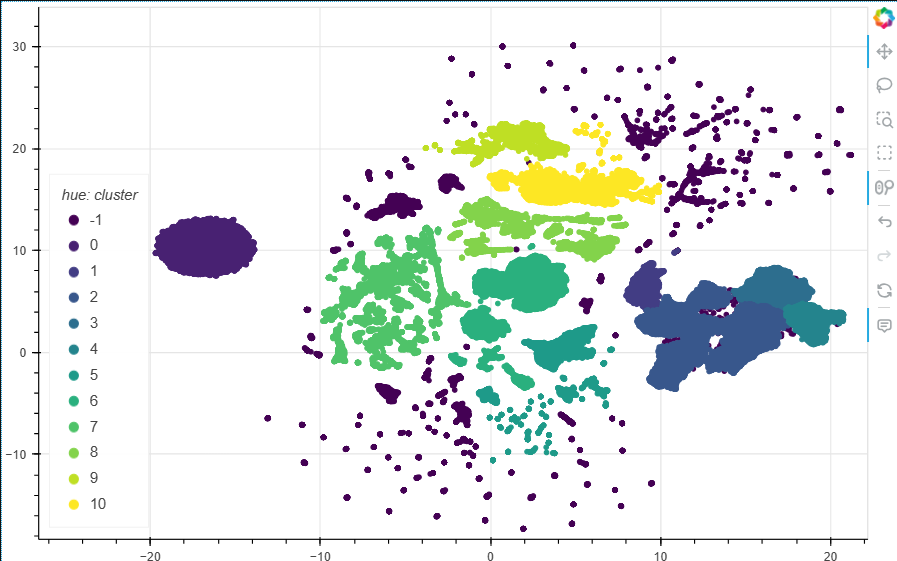

In [4]:
Image('3.png')

Видно, что более простой алгоритм `KMeans` уступает в способности находить кластеры, видно как разделение происходит более или менее по линейным плоскостям. `HDBSCAN` же хорошо находит кластеры. 

In [36]:
embedding_pd = pd.DataFrame(embedding_umap, columns=['x', 'y'])
embedding_pd['cluster'] = clusters_hdbscan

In [37]:
embedding_pd.index = df_pd[~mask].iloc[:N_shap].index
embedding_pd

,x,y,cluster
1,-16.119909,10.470524,0
4,2.816240,17.318529,10
7,-1.312944,9.929069,8
8,-17.010059,9.942846,0
9,-16.423393,8.541512,0
...,...,...,...
830972,-17.295099,8.888868,0
830974,2.843322,15.952944,10
830979,-17.003614,10.510360,0
830983,-19.435442,10.367529,0


### Новая фича - кластер, переобучение с новым признаком

Добавим категориальный признак-кластер. Так как мы проводили кластеризацию на подвыборке данных, экстраполируем кластер на остальные объекты с помощью специально обученной модели.

In [38]:
df_cluster_train = df_pd[~mask].iloc[:N_shap]

In [39]:
for col in [
    "cluster",
]:
    df_cluster_train[col] = embedding_pd[col]

In [40]:
cols_cluster = [col 
                for col in df_cluster_train.columns 
                if col not in [
                    "user_id", 
                    "target", 
                    "cluster", 
                ]
               ]

In [41]:
df_cluster_train

,user_id,target,num_products_click,sum_discount_price_click,max_discount_price_click,mean_relative_discount_click,max_relative_discount_click,days_since_last_click,days_since_first_click,num_products_favorite,...,top1_widget_in_favorite,top2_widget_in_favorite,top3_widget_in_favorite,top1_widget_in_search,top2_widget_in_search,top3_widget_in_search,top1_widget_in_to_cart,top2_widget_in_to_cart,top3_widget_in_to_cart,cluster
1,5282028,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
4,10862889,0,9.0,1563.0,303.0,0.071457,0.643110,49.0,112.0,NaN,...,0,0,0,24,2,0,4,0,0,10
7,687039,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,26,0,0,4,0,0,8
8,2686138,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
9,4269938,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
830972,11030169,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
830974,11025697,0,4.0,2412.0,977.0,0.359288,0.432714,40.0,77.0,NaN,...,0,0,0,24,2,23,4,22,0,10
830979,8355458,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
830983,8427967,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0


In [42]:
mask_cluster = df_cluster_train.index % 10 <= 6

train_cluster_pool = catboost.Pool(
    df_cluster_train.loc[mask_cluster, cols_cluster],
    label=df_cluster_train.loc[mask_cluster]["cluster"],
    cat_features=categorical_features,
    # text_features=text_features
)
eval_cluster_pool = catboost.Pool(
    df_cluster_train.loc[~mask_cluster, cols_cluster],
    label=df_cluster_train.loc[~mask_cluster]["cluster"],
    cat_features=categorical_features,
    # text_features=text_features
)

In [43]:
params_cluster = {
    'iterations': 100,
    'depth': 7, 
    'learning_rate': 0.1, 
    'random_state': 1,
    'eval_metric': 'Accuracy',
    'loss_function': 'MultiClass',
    'task_type': 'GPU',
    # 'text_processing': text_processing_params
}

model_cluster = catboost.CatBoost(params_cluster)
model_cluster.fit(
    train_cluster_pool,
    eval_set=eval_cluster_pool,
    use_best_model=True,
    verbose=10,
    early_stopping_rounds=50,
)

0:	learn: 0.8576905	test: 0.8553528	best: 0.8553528 (0)	total: 129ms	remaining: 12.8s
10:	learn: 0.9127387	test: 0.9113777	best: 0.9115785 (9)	total: 747ms	remaining: 6.04s
20:	learn: 0.9464065	test: 0.9458360	best: 0.9458360 (20)	total: 1.33s	remaining: 4.99s
30:	learn: 0.9544041	test: 0.9534264	best: 0.9534264 (30)	total: 1.91s	remaining: 4.25s
40:	learn: 0.9621622	test: 0.9610838	best: 0.9610838 (40)	total: 2.5s	remaining: 3.6s
50:	learn: 0.9653567	test: 0.9642565	best: 0.9642565 (50)	total: 3.09s	remaining: 2.96s
60:	learn: 0.9690361	test: 0.9684869	best: 0.9686475 (59)	total: 3.67s	remaining: 2.35s
70:	learn: 0.9709813	test: 0.9710973	best: 0.9710973 (70)	total: 4.25s	remaining: 1.74s
80:	learn: 0.9737994	test: 0.9738283	best: 0.9738283 (80)	total: 4.85s	remaining: 1.14s
90:	learn: 0.9760754	test: 0.9760372	best: 0.9762380 (89)	total: 5.57s	remaining: 550ms
99:	learn: 0.9798347	test: 0.9793572	best: 0.9793572 (99)	total: 6.23s	remaining: 0us
bestTest = 0.9793571534
bestIteration =

Сохраним модель, чтобы потом генерировать кластеры для объектов на тестовых данных.

In [44]:
model_cluster.save_model("model_cluster")

Доопределение кластера для остальных данных.

In [45]:
val_cluster_predict = model_cluster.predict(df_pd.loc[~mask, cols][N_shap:], prediction_type='Class')
val_cluster_predict = np.hstack([embedding_pd["cluster"].values, val_cluster_predict.flatten()])
train_cluster_predict = model_cluster.predict(df_pd.loc[mask, cols], prediction_type='Class').flatten()

In [46]:
cluster_column = np.zeros(len(df_pd), dtype=int)
cluster_column[mask] = train_cluster_predict
cluster_column[~mask] = val_cluster_predict

In [47]:
df_pd["cluster"] = cluster_column
df_pd["cluster"]

0          10
1           0
2          10
3           0
4          10
           ..
1874951     7
1874952     0
1874953     0
1874954     0
1874955     0
Name: cluster, Length: 1874956, dtype: int32

Средние по кластеру

In [48]:
for col in [
    'num_products_order_30',
    'sum_discount_price_order',
    'days_since_first_order',
    'days_since_last_order',
    'num_products_to_cart_30',
    'sum_discount_price_to_cart',
    'num_search_30',
]:
    df_pd[f"{col}_cluster_mean"] = df_pd.groupby('cluster')[col].transform('mean')
    df_pd[f"{col}_cluster_std"] = df_pd.groupby('cluster')[col].transform('std')

### Генерация признаков на основе метода ближайших соседей. HNSW

Построим индекс `HNSW` для генерации новых признаков. Индекс будем строить также на `shap_values`, но не на всех признаках, а лишь на самых важных (важность определяю с помощью `model.get_feature_importance()` базовой модели). Также сохраним набор важных признаков в файл, чтобы потом на тестовых данных восстановить knn-признаки (базовая модель также сохраняется в файл).

In [49]:
mask = df_pd.user_id % 10 <= 6
cols = [col for col in df_pd.columns if col not in ["user_id", "target", "cluster"]]

In [50]:
fi = model_basic.get_feature_importance(eval_pool, prettified=True)
fi.head(10)

,Feature Id,Importances
0,purchased_last_2months,18.063939
1,sum_discount_price_to_cart,6.328542
2,days_since_last_order,5.369958
3,num_products_order_30,4.543729
4,days_since_first_order,4.245973
5,sum_discount_price_order,3.247786
6,top1_widget_in_to_cart,2.988729
7,top1_widget_in_search,2.823901
8,click_to_to_cart,2.611093
9,top2_widget_in_search,2.553592


In [51]:
important_features = list(fi.head(6)['Feature Id'])
with open("important_features.txt", "w") as file:
    file.write("\n".join(important_features))

In [52]:
# [:-14] ~ без признаков, связанных с кластерами
shap_pd = pd.DataFrame(shap_values.values, columns=cols[:-14])[important_features]

In [53]:
shap_pd

,purchased_last_2months,sum_discount_price_to_cart,days_since_last_order,num_products_order_30,days_since_first_order,sum_discount_price_order
0,-0.063368,-0.059262,-0.015999,-0.020491,-0.049701,-0.029286
1,-0.079238,-0.088293,-0.010370,-0.039762,-0.032113,-0.042597
2,-0.094210,-0.041003,0.270680,-0.021146,0.202731,-0.044440
3,-0.063368,-0.059262,-0.015999,-0.020491,-0.049701,-0.029286
4,-0.063368,-0.059262,-0.015999,-0.020491,-0.049701,-0.029286
...,...,...,...,...,...,...
563315,-0.264699,0.176353,-0.004844,-0.065534,-0.032910,-0.079849
563316,-0.201655,0.164124,0.000651,-0.061096,-0.003471,-0.061744
563317,-0.063368,-0.059262,-0.015999,-0.020491,-0.049701,-0.029286
563318,0.380683,-0.135325,0.010170,-0.031180,-0.032325,-0.106776


In [54]:
def build_hnsw_index(data, M=64, efConstruction=400, efSearch=128):
    """
    Построение HNSW индекса
    """
    d = data.shape[1]
    
    index = faiss.IndexHNSWFlat(d, M)
    index.hnsw.efConstruction = efConstruction
    index.hnsw.efSearch = efSearch
    index.add(data)
    return index

In [55]:
%%time
hnsw_index = build_hnsw_index(shap_pd)

CPU times: total: 52min 8s
Wall time: 6min 54s


Индекс также записываем в файл.

In [56]:
faiss.write_index(hnsw_index, "hnsw_index.faiss")

In [57]:
shap_values.values.shape

(563320, 152)

In [58]:
%%time
k = 50
important_cols_mask = np.array([True if col in important_features else False for col in cols[:-14]])
shap_values_train = explainer(df_pd.loc[mask, cols[:-14]])[:, important_cols_mask]

CPU times: total: 5min 45s
Wall time: 5min 47s


In [59]:
full_values = np.zeros((shap_values_train.shape[0] + shap_values.shape[0], len(important_features)))
full_values[~mask] = shap_values.values[:, important_cols_mask]
full_values[mask] = shap_values_train.values

In [60]:
%%time
shap_pd_full = pd.DataFrame(full_values, columns=important_features)
D_hnsw, I_hnsw = hnsw_index.search(shap_pd_full, k)

CPU times: total: 2min 22s
Wall time: 20.8 s


In [61]:
y = df_pd["target"].values

In [62]:
def majority_label(neighbor_indices):
    """Возвращает мажоритарное значение таргета среди заданных индексов."""
    labels = y[neighbor_indices]
    return 1 if np.sum(labels) >= (len(labels) / 2) else 0

def mean_label(neighbor_indices):
    """Возвращает среднее значение таргета среди заданных индексов."""
    labels = y[neighbor_indices]
    return np.mean(labels)

def std_label(neighbor_indices):
    """Возвращает среднее квадратическое отклонение таргета среди заданных индексов."""
    labels = y[neighbor_indices]
    return np.std(labels)

В качестве признаков решил взять по `k` из списка `[5, 11, 21, 31, 41, 49]` среднее значение, среднеквадратичное отклонение таргета и моду таргета среди `k` ближайших соседей. Среднее значение и среднее отклонение будут числовыми признаками, мода - бинарным категориальным.

In [63]:
k_values = [5, 11, 21, 31, 41, 49]

for k in tqdm(k_values):
    knn_mean = []
    knn_std = []
    knn_majority = []
    for i, neighbors in tqdm(enumerate(I_hnsw), total=I_hnsw.shape[0]):
        neighbor_idxs = neighbors[neighbors != i][:k]
        knn_mean.append(mean_label(neighbor_idxs))
        knn_std.append(std_label(neighbor_idxs))
        knn_majority.append(majority_label(neighbor_idxs))

    df_pd[f'knn_mean_{k}'] = knn_mean
    df_pd[f'knn_std_{k}'] = knn_std
    df_pd[f'knn_majority_{k}'] = knn_majority

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/1874956 [00:00<?, ?it/s]

  0%|          | 0/1874956 [00:00<?, ?it/s]

  0%|          | 0/1874956 [00:00<?, ?it/s]

  0%|          | 0/1874956 [00:00<?, ?it/s]

  0%|          | 0/1874956 [00:00<?, ?it/s]

  0%|          | 0/1874956 [00:00<?, ?it/s]

In [64]:
df_pd.to_csv("df_train.csv", index=False)

### Тюнинг гиперпараметров. Optuna

In [ ]:
# сброс ноутбука, освобождение памяти
%reset -f
import gc
gc.collect()

In [1]:
import polars as pl
import pandas as pd
import numpy as np
import catboost
from catboost import CatBoostClassifier, Pool
import os
import optuna
from datetime import date, timedelta
from my_utils import embedding_plotter
from sklearn.preprocessing import StandardScaler
import umap.umap_ as umap
import shap
from sklearn.preprocessing import PolynomialFeatures
from sklearn.cluster import KMeans
import hdbscan
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import faiss

In [2]:
text_features = ['name_text', 'type_text', 'search_text']

В данном разделе происходит тюнинг гиперпараметров с помощью `Optuna` и обучение финальной модели с записью её в файл. Подбираем `depth`, `learning_rate`.

In [3]:
actions_id_to_suf = {
    1: "click",
    2: "favorite",
    3: "order",
    4: "search",
    5: "to_cart",
}
k = 3
categorical_features = (
    [
        "cluster",
        "purchased_last_month",
        "purchased_last_2months",
        "purchased_last_3months",
        "to_cart_last_month",
        "to_cart_last_2months",
        "to_cart_last_3months",
    ]
    + [
        f"top{i}_cat_in_{actions_id_to_suf[id_]}"
        for i in range(1, k + 1)
        for id_ in [1, 2, 3, 5]
    ]
    + [
        f"top{i}_widget_in_{actions_id_to_suf[id_]}"
        for i in range(1, k + 1)
        for id_ in [1, 2, 4, 5]
    ]
    + [
        f"knn_majority_{i}"
        for i in [5, 11, 21, 31, 41, 49]
    ]
)

In [4]:
df_pd = pd.read_csv("df_train.csv")

In [5]:
df_pd

,user_id,target,num_products_click,sum_discount_price_click,max_discount_price_click,mean_relative_discount_click,max_relative_discount_click,days_since_last_click,days_since_first_click,num_products_favorite,...,knn_majority_21,knn_mean_31,knn_std_31,knn_majority_31,knn_mean_41,knn_std_41,knn_majority_41,knn_mean_49,knn_std_49,knn_majority_49
0,327344,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,0.451613,0.497653,0,0.463415,0.498660,0,0.428571,0.494872,0
1,5282028,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0.419355,0.493454,0,0.390244,0.487805,0,0.367347,0.482082,0
2,2868175,0,3.0,5977.0,2926.0,0.416963,0.480608,33.0,33.0,NaN,...,0,0.451613,0.497653,0,0.439024,0.496268,0,0.408163,0.491494,0
3,4223165,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0.419355,0.493454,0,0.390244,0.487805,0,0.367347,0.482082,0
4,10862889,0,9.0,1563.0,303.0,0.071457,0.643110,49.0,112.0,NaN,...,0,0.483871,0.499740,0,0.439024,0.496268,0,0.387755,0.487238,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1874951,1614630,0,1.0,109.0,109.0,0.358824,0.358824,67.0,67.0,NaN,...,1,0.483871,0.499740,0,0.390244,0.487805,0,0.387755,0.487238,0
1874952,10026155,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0.419355,0.493454,0,0.390244,0.487805,0,0.367347,0.482082,0
1874953,1493100,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0.419355,0.493454,0,0.390244,0.487805,0,0.367347,0.482082,0
1874954,1466245,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0.419355,0.493454,0,0.390244,0.487805,0,0.367347,0.482082,0


In [6]:
for col in [col for col in df_pd.columns if col.find("cat") != -1]:
    df_pd[col] = df_pd[col].fillna("")

for col in [col for col in df_pd.columns if col.find("widget") != -1]:
    df_pd[col] = df_pd[col].fillna(0)

In [7]:
mask = df_pd.user_id % 10 <= 6

In [8]:
cols = [col for col in df_pd.columns if col not in ["user_id", "target"]]

In [9]:
train_pool = catboost.Pool(
    df_pd.loc[mask, cols],
    label=df_pd.loc[mask].target,
    cat_features=categorical_features,
    # text_features=text_features
)
eval_pool = catboost.Pool(
    df_pd.loc[~mask, cols],
    label=df_pd.loc[~mask].target,
    cat_features=categorical_features,
    # text_features=text_features
)

In [10]:
train_pool.shape, eval_pool.shape

((1311636, 185), (563320, 185))

In [11]:
def my_objective(
    trial: optuna.trial.Trial,
    
    train_pool, eval_pool
):
    '''
    Принимает на вход трейн и валидацию.
    Обучает модель на предложенном наборе гиперпараметров (предлагает optuna) и считает accuracy
    
    returns: accuracy_score
    '''
    params = {
        'iterations': 200,
        'depth': trial.suggest_int("depth", 5, 10),
        'learning_rate': trial.suggest_float("learning_rate", 0.06, 0.25, log=True, step=None), 
        'random_state': 1,
        'eval_metric': 'AUC',
        'loss_function': 'Logloss',
        'task_type': 'GPU',
        'score_function': 'L2'
    }

    model = catboost.CatBoost(params)
    model.fit(
        train_pool, 
        eval_set=eval_pool,
        use_best_model=True,
        verbose=False,
        early_stopping_rounds=50,
    )
    
    results = model.eval_metrics(eval_pool, metrics=['AUC'])
    score = results['AUC'][-1]
    
    return score

In [12]:
study = optuna.create_study(sampler=None, direction="maximize")

from functools import partial

obj_func = partial(
    my_objective,
    train_pool=train_pool, eval_pool=eval_pool,
)

study.optimize(obj_func, n_trials=20, gc_after_trial=True)

[I 2025-04-09 18:35:04,140] A new study created in memory with name: no-name-7b2731c3-230a-40a3-a72c-af33adfbb2ea
Default metric period is 5 because AUC is/are not implemented for GPU
[I 2025-04-09 18:39:28,245] Trial 0 finished with value: 0.7651967268647885 and parameters: {'depth': 10, 'learning_rate': 0.06633809222552267}. Best is trial 0 with value: 0.7651967268647885.
Default metric period is 5 because AUC is/are not implemented for GPU
[I 2025-04-09 18:42:08,351] Trial 1 finished with value: 0.7654708252855367 and parameters: {'depth': 6, 'learning_rate': 0.1926268411331146}. Best is trial 1 with value: 0.7654708252855367.
Default metric period is 5 because AUC is/are not implemented for GPU
[I 2025-04-09 18:44:46,219] Trial 2 finished with value: 0.764725960219275 and parameters: {'depth': 6, 'learning_rate': 0.08573338349483622}. Best is trial 1 with value: 0.7654708252855367.
Default metric period is 5 because AUC is/are not implemented for GPU
[I 2025-04-09 18:48:43,507] Tri

In [13]:
try:
    print(f"{study.best_trial.params = }\n{study.best_value = }")
except NameError:
    pass

study.best_trial.params = {'depth': 9, 'learning_rate': 0.12233826079501094}
study.best_value = 0.7656545863432695


In [14]:
try:
    params = {
        **{
            'iterations': 200,
            'random_state': 1,
            'eval_metric': 'AUC',
            'loss_function': 'Logloss',
            'task_type': 'CPU',
            # 'text_processing': text_processing_params
        },
        **study.best_trial.params
    }
except NameError:
    params = {
        'iterations': 200,
        'depth': 7, 
        'learning_rate': 0.1, 
        'random_state': 1,
        'eval_metric': 'AUC',
        'loss_function': 'Logloss',
        'task_type': 'CPU',
        # 'text_processing': text_processing_params
    }

In [15]:
model = catboost.CatBoost(params)
model.fit(
    train_pool, 
    eval_set=eval_pool,
    use_best_model=True,
    verbose=10,
    early_stopping_rounds=50,
)

0:	test: 0.7504347	best: 0.7504347 (0)	total: 6.44s	remaining: 21m 22s
10:	test: 0.7581856	best: 0.7581856 (10)	total: 1m 1s	remaining: 17m 38s
20:	test: 0.7611353	best: 0.7611353 (20)	total: 1m 53s	remaining: 16m 4s
30:	test: 0.7623527	best: 0.7623527 (30)	total: 2m 43s	remaining: 14m 48s
40:	test: 0.7630720	best: 0.7630720 (40)	total: 3m 32s	remaining: 13m 43s
50:	test: 0.7635313	best: 0.7635313 (50)	total: 4m 22s	remaining: 12m 45s
60:	test: 0.7639530	best: 0.7639530 (60)	total: 5m 10s	remaining: 11m 48s
70:	test: 0.7641265	best: 0.7641265 (70)	total: 5m 58s	remaining: 10m 51s
80:	test: 0.7643415	best: 0.7643415 (80)	total: 6m 46s	remaining: 9m 57s
90:	test: 0.7644793	best: 0.7644793 (90)	total: 7m 35s	remaining: 9m 5s
100:	test: 0.7645706	best: 0.7645706 (100)	total: 8m 23s	remaining: 8m 13s
110:	test: 0.7647096	best: 0.7647157 (109)	total: 9m 13s	remaining: 7m 23s
120:	test: 0.7648127	best: 0.7648127 (120)	total: 10m 2s	remaining: 6m 33s
130:	test: 0.7649650	best: 0.7649747 (128)	

Значения метрик качества на трейне и на валидации:

In [16]:
print(f"train AUC: {model.eval_metrics(train_pool, metrics=['AUC'])['AUC'][-1]}")

train AUC: 0.7706562753181445


In [17]:
print(f"val AUC: {model.eval_metrics(eval_pool, metrics=['AUC'])['AUC'][-1]}")

val AUC: 0.7655919353939118


Посмотрим на важнейшие признаки.

In [18]:
fi = model.get_feature_importance(eval_pool, prettified=True)
fi.head(50)

,Feature Id,Importances
0,sum_discount_price_order_cluster_mean,7.034190
1,days_since_last_order,4.198596
2,sum_discount_price_to_cart,3.860137
3,days_since_first_order,3.742240
4,num_products_order_30,2.718663
5,num_search,2.570042
6,max_discount_price_order_30,2.487473
7,days_since_first_order_cluster_std,2.351239
8,top2_widget_in_search,2.318573
9,sum_discount_price_order,2.299785


Сохраняем модель в файл для дальнейшего использования.

In [19]:
model.save_model("model")

# Предсказание модели на тестовых данных

In [ ]:
# сброс ноутбука, освобождение памяти
%reset -f
import gc
gc.collect()

In [1]:
import polars as pl
import pandas as pd
import numpy as np
import catboost
from catboost import CatBoostClassifier, Pool
import os
import optuna
from datetime import date, timedelta
from my_utils import embedding_plotter
import umap.umap_ as umap
import shap
from sklearn.preprocessing import PolynomialFeatures
from sklearn.cluster import KMeans
import hdbscan
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import faiss

test_start_date = date(2024, 8, 1)
val_start_date = date(2024, 7, 1)
val_end_date = date(2024, 7, 31)
train_end_date = date(2024, 6, 30)
data_path = './contest_1_data'

actions_history = pl.read_parquet(os.path.join(data_path, 'actions_history'))
search_history = pl.read_parquet(os.path.join(data_path, 'search_history'))
product_information = (
    pl.read_csv(os.path.join(data_path, 'product_information.csv'))
    .with_columns(
        ((pl.col("price") - pl.col("discount_price")) / pl.col("price"))
        .alias("relative_discount")
    )
)

In [2]:
text_features = ['name_text', 'type_text', 'search_text']

In [3]:
model = catboost.CatBoost()
model.load_model("model")

In [4]:
test_users_submission = (
    pl.read_csv(os.path.join(data_path, 'test_users.csv'))
)

In [5]:
actions_aggs_test = {}
actions_id_to_suf = {
    1: "click",
    2: "favorite",
    3: "order",
    5: "to_cart",
}
for id_, suf in tqdm(actions_id_to_suf.items()):
    aggs = (
        actions_history
        .filter(pl.col('timestamp').dt.date() <= val_end_date)
        .filter(pl.col('timestamp').dt.date() >= val_end_date - timedelta(days=30 * 4))
        .filter(pl.col('action_type_id') == id_)
        .join(
            product_information
            .select('product_id', 'discount_price', 'relative_discount'),
            on='product_id',
        )
        .group_by('user_id')
        .agg(
            pl.count('product_id').cast(pl.Int32).alias(f'num_products_{suf}'),
            pl.sum('discount_price').cast(pl.Float32).alias(f'sum_discount_price_{suf}'),
            pl.max('discount_price').cast(pl.Float32).alias(f'max_discount_price_{suf}'),
            pl.mean('relative_discount').cast(pl.Float32).alias(f'mean_relative_discount_{suf}'), # new
            pl.max('relative_discount').cast(pl.Float32).alias(f'max_relative_discount_{suf}'), # new
            pl.max('timestamp').alias(f'last_{suf}_time'),
            pl.min('timestamp').alias(f'first_{suf}_time'),
        )
        .with_columns([
            (pl.lit(test_start_date) - pl.col(f'last_{suf}_time'))
            .dt.total_days()
            .cast(pl.Int32)
            .alias(f'days_since_last_{suf}'),
            
            (pl.lit(test_start_date) - pl.col(f'first_{suf}_time'))
            .dt.total_days()
            .cast(pl.Int32)
            .alias(f'days_since_first_{suf}'),
        ])
        .select(
            'user_id',
            f'num_products_{suf}',
            f'sum_discount_price_{suf}',
            f'max_discount_price_{suf}',
            f'mean_relative_discount_{suf}',
            f'max_relative_discount_{suf}',
            f'days_since_last_{suf}',
            f'days_since_first_{suf}',
        )
    )
    actions_aggs_test[id_] = aggs

  0%|          | 0/4 [00:00<?, ?it/s]

In [6]:
# search_aggs
id_ = 4
suf = 'search'
actions_aggs_test[id_] = (
    search_history
    .filter(pl.col('action_type_id') == id_)
    .filter(pl.col('timestamp').dt.date() <= val_end_date)
    .filter(pl.col('timestamp').dt.date() >= val_end_date - timedelta(days=30 * 4))
    .group_by('user_id')
    .agg(
        pl.count('search_query').cast(pl.Int32).alias(f'num_{suf}'),
        pl.max('timestamp').alias(f'last_{suf}_time'),
        pl.min('timestamp').alias(f'first_{suf}_time'),
    )
    .with_columns([
        (pl.lit(test_start_date) - pl.col(f'last_{suf}_time'))
        .dt.total_days()
        .cast(pl.Int32)
        .alias(f'days_since_last_{suf}'),

        (pl.lit(test_start_date) - pl.col(f'first_{suf}_time'))
        .dt.total_days()
        .cast(pl.Int32)
        .alias(f'days_since_first_{suf}'),
    ])
    .select(
        'user_id',
        f'num_{suf}',
        f'days_since_last_{suf}',
        f'days_since_first_{suf}',
    )
)

In [7]:
test_users_submission

user_id
i64
1342
9852
10206
11317
13289
…
11157283
11160395
11165052


In [8]:
df_test = test_users_submission
for _, actions_aggs_df in actions_aggs_test.items():
    df_test = (
        df_test
        .join(actions_aggs_df, on='user_id', how='left')
    )

In [9]:
conversion_list = [
    ('click', 'favorite'),
    ('click', 'to_cart'),
    ('click', 'order'),
    ('favorite', 'to_cart'),
    ('favorite', 'order'),
    ('to_cart', 'order')
]

df_conversions_test = {}
# конверсия из A в B
for A, B in conversion_list:
    df_conversions_test[f"{A}_to_{B}"] = df_test.filter(
        (pl.col(f"num_products_{A}") > 0)
        & (pl.col(f"num_products_{B}") > 0)
    ).with_columns(
        (pl.col(f"num_products_{B}") / pl.col(f"num_products_{A}")).alias(f"{A}_to_{B}"),
    ).select(["user_id", f"{A}_to_{B}"])

for A, B in conversion_list:
    df_test = df_test.join(df_conversions_test[f"{A}_to_{B}"], on="user_id", how="left")

In [10]:
actions_id_to_suf = {
    1: "click",
    2: "favorite",
    3: "order",
    5: "to_cart",
}
action_aggs_window_test = {}
for window in [7, 14, 30]:
    action_aggs_window_test[window] = {}
    for id_, suf in tqdm(actions_id_to_suf.items()):
        action_aggs_window_test[window][id_] = (
            actions_history
            .filter(pl.col('timestamp').dt.date() <= val_end_date)
            .filter(pl.col('timestamp').dt.date() >= val_end_date - timedelta(days=window))
            .filter(pl.col('action_type_id') == id_)
            .join(
                product_information
                .select('product_id', 'discount_price', 'relative_discount'),
                on='product_id', 
            )
            .group_by('user_id')
            .agg(
                pl.count('product_id').cast(pl.Int32).alias(f'num_products_{suf}_{window}'),
                pl.sum('discount_price').cast(pl.Float32).alias(f'sum_discount_price_{suf}_{window}'),
                pl.max('discount_price').cast(pl.Float32).alias(f'max_discount_price_{suf}_{window}'),
                pl.mean('relative_discount').cast(pl.Float32).alias(f'mean_relative_discount_{suf}_{window}'),
                pl.max('relative_discount').cast(pl.Float32).alias(f'max_relative_discount_{suf}_{window}')
            )
            .select(
                'user_id',
                f'num_products_{suf}_{window}',
                f'sum_discount_price_{suf}_{window}',
                f'max_discount_price_{suf}_{window}',
                f'mean_relative_discount_{suf}_{window}',
                f'max_relative_discount_{suf}_{window}',
            )
        )

id_ = 4
suf = 'search'
for window in [7, 14, 30]:
    action_aggs_window_test[window][id_] = (
        search_history
        .filter(pl.col('action_type_id') == id_)
        .filter(pl.col('timestamp').dt.date() <= val_end_date)
        .filter(pl.col('timestamp').dt.date() >= val_end_date - timedelta(days=window))
        .group_by('user_id')
        .agg(
            pl.count('search_query').cast(pl.Int32).alias(f'num_{suf}_{window}'),
        )
        .select(
            'user_id',
            f'num_{suf}_{window}',
        )
    )

for window in [7, 14, 30]:
    for action_id in range(1, 6):
        df_test = df_test.join(action_aggs_window_test[window][action_id], on="user_id", how="left")

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

In [11]:
df_test = df_test.join(
    search_history
    .filter(pl.col('timestamp').dt.date() <= val_end_date)
    .filter(pl.col('timestamp').dt.date() >= val_end_date - timedelta(days=window))
    .group_by("user_id").agg(
        pl.col("search_query").len().alias("mean_length_of_query")
    ).cast(pl.Int32),
    on="user_id", how="left"
)

In [12]:
widget_pivot = (
    actions_history
    .filter(pl.col('timestamp').dt.date() <= val_end_date)
    .filter(pl.col('timestamp').dt.date() >= val_end_date - timedelta(days=30 * 4))
    .pivot(
        index="user_id",          # группируем по user_id
        on="widget_name_id",      # создаём столбцы для каждого widget_id
        values="widget_name_id",       # будем агрегировать по widget_id
        aggregate_function="len"      # считаем количество записей
    ).
    fill_null(0)
)
widget_pivot = widget_pivot.select(
    ["user_id"] + sorted(widget_pivot.columns[1:], key=lambda x: int(x))
)
df_test = df_test.join(widget_pivot, on="user_id", how="left")

In [13]:
# text_search = (
#     search_history
#     .filter(pl.col('action_type_id') == 4)
#     .filter(pl.col('timestamp').dt.date() <= val_end_date)
#     .filter(pl.col('timestamp').dt.date() >= val_end_date - timedelta(days=30))
#     .group_by('user_id')
#     .agg(
#         pl.col("search_query").str.concat(" ").alias("search_text")
#     ).select(
#         'user_id',
#         'search_text',
#     )
# )
# df_test = df_test.join(text_search, on="user_id", how="left")

# text_order = (
#         actions_history
#         .filter(pl.col('timestamp').dt.date() <= val_end_date)
#         .filter(pl.col('timestamp').dt.date() >= val_end_date - timedelta(days=30 * 4))
#         .filter(pl.col('action_type_id') == 3)
#         .join(
#             product_information
#             .select('product_id', 'name', 'type'),
#             on='product_id',
#         )
#         .group_by('user_id')
#         .agg(
#             pl.col("name").str.concat(" ").alias("name_text"),
#             pl.col("type").str.concat(" ").alias("type_text")
#         )
#         .select(
#             'user_id',
#             'name_text',
#             'type_text',
#         )
#     )
# df_test = df_test.join(text_search, on="user_id", how="left")

# def truncate_text(text, max_tokens=20):
#     tokens = text.split()
#     return " ".join(tokens[:max_tokens])

# for col in tqdm(text_features):
#     df_pd[col] = df_pd[col].fillna("").astype('string')
#     df_pd[col] = df_pd[col].apply(lambda x: truncate_text(x, max_tokens=20))
# df_pd[text_features]

Неудавшаяся идея полиномиальных фичей.

In [14]:
# columns_poly_list = [
#     ["num_products_order",	"sum_discount_price_order",	"max_discount_price_order"],
#     ["num_products_to_cart", "sum_discount_price_to_cart", "max_discount_price_to_cart"],
#     ["click_to_to_cart", "click_to_order", "to_cart_to_order"],
#     ['num_search', 'mean_length_of_query']
# ]

# for cols in columns_poly_list:
#     df_poly = df_test.select(["user_id"] + cols)
#     for col in cols:
#         df_poly = df_poly.filter(pl.col(col).is_not_null())

#     X = df_poly.select(cols)
#     poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
#     X_poly = poly.fit_transform(X)
    
#     all_cols = list(poly.get_feature_names_out(cols))
#     new_cols = [col for col in all_cols if col not in cols]
#     df_poly = df_poly.select("user_id").hstack(pl.DataFrame(X_poly, schema=all_cols).select(new_cols))
#     print(df_poly)
    
#     df_test = df_test.join(df_poly, on="user_id", how="left")

In [15]:
df_is_ordered_test = (
    actions_history
    .filter(pl.col('timestamp').dt.date() <= val_end_date)
    .filter(pl.col('timestamp').dt.date() >= val_end_date - timedelta(days=30 * 4))
    .filter(pl.col('action_type_id') == 3)
    .group_by("user_id")
    .agg(
        pl.col("timestamp").max().alias("last_order_ts"),
        purchased_last_month=pl.col("timestamp")
            .filter(pl.col("timestamp") >= val_end_date - timedelta(days=30))
            .count() > 0,
        purchased_last_2months=pl.col("timestamp")
            .filter(pl.col("timestamp") >= val_end_date - timedelta(days=30 * 2))
            .count() > 0,
        purchased_last_3months=pl.col("timestamp")
            .filter(pl.col("timestamp") >= val_end_date - timedelta(days=30 * 3))
            .count() > 0
    )
).drop("last_order_ts")

df_is_to_cart_test = (
    actions_history
    .filter(pl.col('timestamp').dt.date() <= val_end_date)
    .filter(pl.col('timestamp').dt.date() >= val_end_date - timedelta(days=30 * 4))
    .filter(pl.col('action_type_id') == 5).group_by("user_id")
    .agg(
        pl.col("timestamp").max().alias("last_to_cart_ts"),
        to_cart_last_month=pl.col("timestamp")
            .filter(pl.col("timestamp") >= val_end_date - timedelta(days=30))
            .count() > 0,
        to_cart_last_2months=pl.col("timestamp")
            .filter(pl.col("timestamp") >= val_end_date - timedelta(days=30 * 2))
            .count() > 0,
        to_cart_last_3months=pl.col("timestamp")
            .filter(pl.col("timestamp") >= val_end_date - timedelta(days=30 * 3))
            .count() > 0
    )
).drop("last_to_cart_ts")

k = 3
topk_product_cats_test = {}
actions_id_to_suf = {
    1: "click",
    2: "favorite",
    3: "order",
    5: "to_cart",
}
for id_, suf in tqdm(actions_id_to_suf.items()):
    topk_agg = (
        actions_history
        .filter(pl.col('timestamp').dt.date() <= val_end_date)
        .filter(pl.col('timestamp').dt.date() >= val_end_date - timedelta(days=30 * 4))
        .filter(pl.col("action_type_id") == id_)
        .join(
            product_information
            .select(["product_id", "category_name"]),
            on="product_id",
        )
        .group_by("user_id", "category_name")
        .agg(pl.len().alias("count"))
        .with_columns(
            pl.col("category_name").sort_by(by=["count", "category_name"], descending=[True, False])
            .over("user_id")
            .alias("sorted_values")
        )
        .group_by("user_id")
        .agg(pl.col("sorted_values").head(k).alias("top_values"))
        .with_columns(
            pl.col("top_values").list.to_struct(fields=[f"top{i}_cat_in_{suf}" for i in range(1, k + 1)])
        )
        .unnest(columns="top_values")
    )
    topk_product_cats_test[id_] = topk_agg

topk_widg_test = {}
actions_id_to_suf = {
    1: "click",
    2: "favorite",
    # 3: "order", так как в заказе только один виджет, нет смысла
    5: "to_cart",
}
for id_, suf in tqdm(actions_id_to_suf.items()):
    topk_agg = (
        actions_history
        .filter(pl.col('timestamp').dt.date() <= val_end_date)
        .filter(pl.col('timestamp').dt.date() >= val_end_date - timedelta(days=30 * 4))
        .filter(pl.col("action_type_id") == id_)
        .group_by("user_id", "widget_name_id")
        .agg(pl.len().alias("count"))
        .with_columns(
            pl.col("widget_name_id").sort_by(by=["count", "widget_name_id"], descending=[True, False])
            .over("user_id")
            .alias("sorted_values")
        )
        .group_by("user_id")
        .agg(pl.col("sorted_values").head(k).alias("top_values"))
        .with_columns(
            pl.col("top_values").list.to_struct(fields=[f"top{i}_widget_in_{suf}" for i in range(1, k + 1)])
        )
        .unnest(columns="top_values")
    )
    topk_widg_test[id_] = topk_agg

# for search

topk_agg = (
     search_history
    .filter(pl.col('timestamp').dt.date() <= val_end_date)
    .filter(pl.col('timestamp').dt.date() >= val_end_date - timedelta(days=30 * 4))
    .filter(pl.col("action_type_id") == 4)
    .group_by("user_id", "widget_name_id")
    .agg(pl.len().alias("count"))
    .with_columns(
        pl.col("widget_name_id").sort_by(by=["count", "widget_name_id"], descending=[True, False])
        .over("user_id")
        .alias("sorted_values")
    )
    .group_by("user_id")
    .agg(pl.col("sorted_values").head(k).alias("top_values"))
    .with_columns(
        pl.col("top_values").list.to_struct(fields=[f"top{i}_widget_in_search" for i in range(1, k + 1)])
    ).unnest(columns="top_values")
)
topk_widg_test[4] = topk_agg

df_test = df_test.join(df_is_ordered_test, on="user_id", how="left")
df_test = df_test.join(df_is_to_cart_test, on="user_id", how="left")
for id_ in [1, 2, 3, 5]:
    df_test = df_test.join(topk_product_cats_test[id_], on="user_id", how="left")
for id_ in [1, 2, 4, 5]:
    df_test = df_test.join(topk_widg_test[id_], on="user_id", how="left")

df_test = df_test.with_columns(pl.col("purchased_last_month").fill_null(False))
df_test = df_test.with_columns(pl.col("purchased_last_2months").fill_null(False))
df_test = df_test.with_columns(pl.col("purchased_last_3months").fill_null(False))

df_test = df_test.with_columns(pl.col("to_cart_last_month").fill_null(False))
df_test = df_test.with_columns(pl.col("to_cart_last_2months").fill_null(False))
df_test = df_test.with_columns(pl.col("to_cart_last_3months").fill_null(False))

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

In [16]:
for col in [col for col in df_test.columns if col.find("cat") != -1]:
    df_test = df_test.with_columns(pl.col(col).fill_null(""))

for col in [col for col in df_test.columns if col.find("widget") != -1]:
    df_test = df_test.with_columns(pl.col(col).fill_null(0))

df_pd_test = df_test.to_pandas()

In [17]:
model_cluster = catboost.CatBoost()
model_cluster.load_model("model_cluster")
pass

In [18]:
cols = [col for col in df_pd_test.columns if col not in ["user_id"]]
df_pd_test["cluster"] = model_cluster.predict(df_pd_test[cols], prediction_type='Class').flatten()

In [19]:
for col in [
    'num_products_order_30',
    'sum_discount_price_order',
    'days_since_first_order',
    'days_since_last_order',
    'num_products_to_cart_30',
    'sum_discount_price_to_cart',
    'num_search_30',
]:
    df_pd_test[f"{col}_cluster_mean"] = df_pd_test.groupby('cluster')[col].transform('mean')
    df_pd_test[f"{col}_cluster_std"] = df_pd_test.groupby('cluster')[col].transform('std')

In [20]:
df_pd_test

,user_id,num_products_click,sum_discount_price_click,max_discount_price_click,mean_relative_discount_click,max_relative_discount_click,days_since_last_click,days_since_first_click,num_products_favorite,sum_discount_price_favorite,...,days_since_first_order_cluster_mean,days_since_first_order_cluster_std,days_since_last_order_cluster_mean,days_since_last_order_cluster_std,num_products_to_cart_30_cluster_mean,num_products_to_cart_30_cluster_std,sum_discount_price_to_cart_cluster_mean,sum_discount_price_to_cart_cluster_std,num_search_30_cluster_mean,num_search_30_cluster_std
0,1342,1.0,1213.0,1213.0,0.260366,0.260366,101.0,101.0,1.0,1213.0,...,NaN,NaN,NaN,NaN,2.228436,6.231680,1189.201294,4942.777814,21.853875,26.371253
1,9852,23.0,7446.0,1640.0,0.122578,0.510137,20.0,113.0,NaN,NaN,...,57.755734,34.905848,10.598036,8.741051,26.923464,35.941305,25878.023438,46061.580293,23.100607,29.971353
2,10206,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,88.685467,18.155433,86.998356,17.854489,8.709018,21.449047,4206.707520,17180.166169,3.628782,9.280130
3,11317,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,88.685467,18.155433,86.998356,17.854489,8.709018,21.449047,4206.707520,17180.166169,3.628782,9.280130
4,13289,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,32.936829,24.156562,25.891234,17.547968,3.895524,6.271409,2300.279297,6052.870524,5.144501,6.928147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2068419,11157283,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,88.685467,18.155433,86.998356,17.854489,8.709018,21.449047,4206.707520,17180.166169,3.628782,9.280130
2068420,11160395,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,89.0,...,88.685467,18.155433,86.998356,17.854489,8.709018,21.449047,4206.707520,17180.166169,3.628782,9.280130
2068421,11165052,9.0,2515.0,592.0,0.188324,0.718095,6.0,118.0,NaN,NaN,...,57.755734,34.905848,10.598036,8.741051,26.923464,35.941305,25878.023438,46061.580293,23.100607,29.971353
2068422,11168218,4.0,870.0,329.0,0.194805,0.389610,34.0,118.0,NaN,NaN,...,87.008376,18.377253,85.297357,17.895935,8.182232,15.838899,4352.901367,15691.992514,6.469081,10.650359


In [21]:
cols = [col for col in df_pd_test.columns if col not in ["user_id", "target", "cluster"]]
model_basic = catboost.CatBoost()
model_basic.load_model("model_basic")
explainer = shap.TreeExplainer(model_basic)
shap_values = explainer(df_pd_test[cols[:-14]])
important_features = []
with open("important_features.txt", "r") as file:
    for line in file:
        important_features.append(line.strip())
shap_pd = pd.DataFrame(shap_values.values, columns=cols[:-14])[important_features]
y = pd.read_csv('df_train.csv', usecols=['target']).values

In [22]:
hnsw_index = faiss.read_index("hnsw_index.faiss")
k = 50
D_hnsw, I_hnsw = hnsw_index.search(shap_pd, k)

def majority_label(neighbor_indices):
    """Возвращает мажоритарное значение таргета среди заданных индексов."""
    labels = y[neighbor_indices]
    return 1 if np.sum(labels) >= (len(labels) / 2) else 0

def mean_label(neighbor_indices):
    """Возвращает среднее значение таргета среди заданных индексов."""
    labels = y[neighbor_indices]
    return np.mean(labels)

def std_label(neighbor_indices):
    """Возвращает среднее квадратическое отклонение таргета среди заданных индексов."""
    labels = y[neighbor_indices]
    return np.std(labels)

k_values = [5, 11, 21, 31, 41, 49]

for k in tqdm(k_values):
    knn_mean = []
    knn_std = []
    knn_majority = []
    for i, neighbors in tqdm(enumerate(I_hnsw), total=I_hnsw.shape[0]):
        neighbor_idxs = neighbors[neighbors != i][:k]
        knn_mean.append(mean_label(neighbor_idxs))
        knn_std.append(std_label(neighbor_idxs))
        knn_majority.append(majority_label(neighbor_idxs))

    df_pd_test[f'knn_mean_{k}'] = knn_mean
    df_pd_test[f'knn_std_{k}'] = knn_std
    df_pd_test[f'knn_majority_{k}'] = knn_majority

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/2068424 [00:00<?, ?it/s]

  0%|          | 0/2068424 [00:00<?, ?it/s]

  0%|          | 0/2068424 [00:00<?, ?it/s]

  0%|          | 0/2068424 [00:00<?, ?it/s]

  0%|          | 0/2068424 [00:00<?, ?it/s]

  0%|          | 0/2068424 [00:00<?, ?it/s]

In [23]:
df_pd_test

,user_id,num_products_click,sum_discount_price_click,max_discount_price_click,mean_relative_discount_click,max_relative_discount_click,days_since_last_click,days_since_first_click,num_products_favorite,sum_discount_price_favorite,...,knn_majority_21,knn_mean_31,knn_std_31,knn_majority_31,knn_mean_41,knn_std_41,knn_majority_41,knn_mean_49,knn_std_49,knn_majority_49
0,1342,1.0,1213.0,1213.0,0.260366,0.260366,101.0,101.0,1.0,1213.0,...,0,0.290323,0.453911,0,0.243902,0.429435,0,0.265306,0.441496,0
1,9852,23.0,7446.0,1640.0,0.122578,0.510137,20.0,113.0,NaN,NaN,...,0,0.387097,0.487086,0,0.390244,0.487805,0,0.387755,0.487238,0
2,10206,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,0.451613,0.497653,0,0.439024,0.496268,0,0.408163,0.491494,0
3,11317,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0.419355,0.493454,0,0.414634,0.492659,0,0.428571,0.494872,0
4,13289,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0.419355,0.493454,0,0.390244,0.487805,0,0.408163,0.491494,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2068419,11157283,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0.354839,0.478464,0,0.390244,0.487805,0,0.346939,0.475996,0
2068420,11160395,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,89.0,...,0,0.354839,0.478464,0,0.390244,0.487805,0,0.346939,0.475996,0
2068421,11165052,9.0,2515.0,592.0,0.188324,0.718095,6.0,118.0,NaN,NaN,...,0,0.354839,0.478464,0,0.341463,0.474201,0,0.306122,0.460881,0
2068422,11168218,4.0,870.0,329.0,0.194805,0.389610,34.0,118.0,NaN,NaN,...,0,0.225806,0.418112,0,0.243902,0.429435,0,0.265306,0.441496,0


In [24]:
actions_id_to_suf = {
    1: "click",
    2: "favorite",
    3: "order",
    4: "search",
    5: "to_cart",
}

k = 3
categorical_features = (
    [
        "cluster",
        "purchased_last_month",
        "purchased_last_2months",
        "purchased_last_3months",
        "to_cart_last_month",
        "to_cart_last_2months",
        "to_cart_last_3months",
    ]
    + [
        f"top{i}_cat_in_{actions_id_to_suf[id_]}"
        for i in range(1, k + 1)
        for id_ in [1, 2, 3, 5]
    ]
    + [
        f"top{i}_widget_in_{actions_id_to_suf[id_]}"
        for i in range(1, k + 1)
        for id_ in [1, 2, 4, 5]
    ]
    + [
        f"knn_majority_{i}"
        for i in [5, 11, 21, 31, 41, 49]
    ]
)

In [25]:
cols = [col for col in df_pd_test.columns if col != "user_id"]
test_pool = catboost.Pool(
    df_pd_test[cols],
    cat_features=categorical_features,
    # text_features=text_features
)

In [26]:
model = catboost.CatBoost()
model.load_model("model")

In [27]:
fi = model.get_feature_importance(test_pool, prettified=True)
fi.head(50)

,Feature Id,Importances
0,days_since_first_order_cluster_std,8.249481
1,days_since_last_order,5.410257
2,sum_discount_price_to_cart,3.756988
3,days_since_first_order,3.008808
4,sum_discount_price_order_cluster_mean,2.496509
5,num_search,2.470524
6,max_discount_price_order_30,2.443211
7,num_products_order_30,2.248780
8,21,2.202998
9,top2_widget_in_search,2.193281


In [28]:
cols = [col for col in df_pd_test.columns if col != "user_id"]
df_pd_test['predict'] = model.predict(df_pd_test[cols], prediction_type="Probability")[:, 1]

In [29]:
df_pd_test[['user_id', 'predict']]

,user_id,predict
0,1342,0.161286
1,9852,0.722125
2,10206,0.262057
3,11317,0.258124
4,13289,0.575170
...,...,...
2068419,11157283,0.267041
2068420,11160395,0.097736
2068421,11165052,0.641397
2068422,11168218,0.439412


In [30]:
df_pd_test[['user_id', 'predict']].to_csv('baseline_1_submission.csv', index=False)